# 122108131

# EE6024

#         <font color=blue> SUMMARY<font>

The ANSer algorithm stands for Algorithm for Neonatal Seizure Recognition. This is a machine learning based algorithm for detecting seizures from EEG (Electroencephalograph) signals. The Algorithms constitutes the followinf steps, pre-processing of the EEG data, feature extraction to extract time domain and frequency domain charcateristics of the EEG data, feature selection this includes selecting the best features or all features (time domain and frequency domain), and classification in which a model a trained to classify as seizure or non-seizure. The time domain and frequency domain features capture the dynamics and characteristics of the eeg signal in each epoch. The feature also involves adjusting probability thresholds in the post-processing and testing phase so as to improve the specificity and sensitivity of the classifier in order to have decent good detection rates at a low false detection per hour. 

The Dataset given in this assignment, contain the EEG data of 17 neonatal patients, and their corresponding annotations.
A 10-20 system electrode placement was used to obtain the EEG data and as such 8 channels were constructed from this. The channels are: `F4-C4`, `C4-O2`,`F3-C3`,`C3-O1`,`T4-C4`,`C4-Cz`,`Cz-C3`, and `C3-T3`, each channel has its own eeg signal and corresponding annotations. These annotations are the result of 3 independent experts marking seizures and non seizure for each channel, a value of `1` in the annotations file corresponds to a seizure and  `0` corresponds to non-seizure. It is also worth mentioning that the eeg signals for all patients originally recorded at 256HZ have been downsampled to 32Hz, this means that it captures signals in the range 0-16Hz which is fine as most seizures occur in the range `0.5Hz - 13Hz`. The approach used for this ANSer was to split each eeg signal in every channel for every patient into epochs of 8 seconds with 50 % overlap, so as to preceed with time domain, and frequency domain feature extraction for every epoch. 

An OOP (Object Oriented Programming) approach was adopted for this assignment. A class `Patient` was used for creating `Patient` object, this is a helpful approach because a leave-one-out approach was used for validation, in leave one out, one patient is used as a test subject while the others are used as training subjects, this is repeated iteratively until all patients have been test cases exactly once. With an OOP approach, patient instances can be testing using this validation paradigm because, attributes unique to the patient that is, the patients eeg signal every epoch per channel and the patient annotations can be called and used for testing the classifier. 

Every code is duly commented and the report follows a sequential flow, in a manner that is quite coherent. 

# IMPORT NEEDED LIBRARIES

In [1]:
import os
import pandas as pd
import numpy as np
import re
import math
import matplotlib.pyplot as plt
from scipy.signal import periodogram 
from scipy.stats import kurtosis
from scipy.stats import skew


#### Create a list of lists, each list in the parent list contains the directory or annotation and processed eeg files 

In [2]:
#using list comprehension to create a list of list `path_info`, 
#the nested list contains the directory of each patient's eeg file 
#and annotation excel file.
path_info = [ [] for i in range(17)]

#create a list of all the files in the directory for annotations using the
#listdir function in python's os module
annotations_path = os.listdir('Train_dataset/NewChannelAnnotations')

#doing the same for the processed eeg files
eeg_path = os.listdir('Train_dataset/ProcessedEEG')

#for loop to populate the list and nested lists described above, 
#annotations path with be the first element of each nested list
for i in range(len(annotations_path)):
    annotations_path[i] = 'Train_dataset/NewChannelAnnotations/' + annotations_path[i]
    path_info[i].append(annotations_path[i])

#for loop to accomodated eeg_paths in the nested lists, so that they
#would be the second element of the nested list
#i.e [[annotation_path, eeg_signal_path],...,..]
for i in range(len(eeg_path)):
    eeg_path[i] = 'Train_dataset/ProcessedEEG/' + eeg_path[i]
    path_info[i].append(eeg_path[i])

#### DEFINE GLOBAL VARIABLES THAT WOULD BE USED, EPOCH, SAMPLE LENGTH, PERCENTAGE OVERLAP FOR THE EPOCHS, AND SAMPLING FREQUENCY OF THE EEG SIGNAL

In [3]:
#A global scope in python means the variable are available at all 
#scope in the code, so within any functions and or methods defined
#within the whole code

#epoch length is 256, this is due to the fact that 8 seconds of a signal 
#sample at 32 hertz means that each second matches 32 samples, so 8 seconds
#is 32 * 8 samples
epoch_sample_length = 256

#percentage overlap is expressed as a ratio of 100, so 0.5 infers 50 %
percent_overlap = 0.5

#fs is sample frequency, which is the frequecny the eeg signals are sampled at
fs = 32

#         <font color=blue> Why Epochs? What are Epochs and why 8 seconds epoch lengths<font>

For a time series data, an epoch refers to a specific time interval during which the time series data/signal is analyzed or processd. This time interval is in seconds, the epoch length should be relevant to the type of time series signal being processed, so any epoch choosen much be characterized by the type of signal being analysed e.g speech, images etc. The choice of epoch is very crucial as it can affect the performance of models developed, the epoch should be long enough to capture enough characteristics of the signal and short enought to reduce signal to noise ratio, this is the trade off involved in selecting epoch length.

8 seconds is most commonly used for epoch lengths, just like in the paper referenced for this asignment provided by the professors on canvas. 8 seconds is decent for neonatal seizure detection, because infants normally have shorter and more irregular seizure times than adults, 8 seconds is ideal enough to capture enough information at an good resolution. 

As explained in the previous cell because the signal is sampled at 32Hz (i.e 32 samples in one second) an 8 second epoch corresponds to (32 samples * 8 seconds which is 256 samples in 8 seconds). 

# <font color=blue>TIME DOMAIN FEATURES</font>

## <b>line length</b>
Line length is a time domain characteristic of time series signals like the eeg data in this assignment, the line lengths of a signal captures the length of the line of the windows or epochs of the signal, an epoch with a shorter line length implies more resolution, while onw with a longer line length although it captures more information on the global characteristics of the overall signal has poorer resolution due to the low signal to noise ratio. The formula for line length is given below: 

$$ L = \sum_{i=0}^{N-2} |x(i+1) - x(i)|$$

where the index for the epoch is between $0$ and $N-1$, ie. $x(0) - x(N-1)$.

A function to calculate the line length takes as the parameters the number of samples in an epoch and the epoch of data.


## <b>Non-linear Energy</b>
Non-linear is very useful for signals that contain non-linearities, that it cannot be be determined by a linear function, the input signal and output signal relationship is non-linear, non-linearity is another relevant feature that can be extracted from an eeg signal, because they tend to be non-linear for the most part. Non-linear energy helps to calculate non-linearities in every epoch of the signal, it is the calculated as follows:

$$ \frac{1}{N-2} \sum_ {K=1}^{N-1}(x^2(k) - x(k-1) \times x(k+1))$$


## <b>Root Mean Square Amplitude</b>
As the name implies this is the root sqaure of the mean of the squares of the sample points in one epoch worth of data, This time domain feature is capable of capturing the overal energy in each epoch of the signal invariably capturing the amplitude or intensity of the signal, it gives the intensity of each epoch. It can be computed by the formula below

$$ \sqrt{\frac{1}{N}\sum_{i=0}^{N-1}x^2(k)}^2$$

## <b>1st Hjorth or activity</b>
This is simply the variance of each epoch, this is a statistical property of the signal in the time domain, the variance represents signal power, The formula to calculate this is provide below:

$$ activity = \frac{1}{N}\sum_{k=0}^{N-1}{x(k)-\mu}^2$$
where $\mu$ is the mean of one epoch worth of eeg data

## <b>2nd Hjorth or Mobility</b>
2nd hjorth is the mobility of the signal this gives insight on how the signak changes over time, how fast it does so, it is the mean frequency of the signal, square root of the ratio of the variance of the first derivative of the signal to the the variance of the signal or the ratio of its standard deviations, given as 

$$ mobility = \sqrt{\frac{\sigma^2_\delta}{\sigma^2_x}}$$

## <b>3rd Hjorth or Complexity</b>
3rd hjorth or complexity captures the change in frequency, by comparing the signal to a pure sinusoidal. The closer the value is to 1, the more that epoch or signal is similar to a sine wave. It is given as 

$ Complexity = \frac{Mobility\  of\   the\   first\   derivative}{mobility\   of\   the\   original\   signal}$

## <b>Zero crossing rate</b>
This gives an insight on the frequency of a signal, the higher it is the the higher the frequency contained in the signal, this is a time domain feature that can prove relevant in decomposing original eeg channel datas, a python code is provided to cater to this.

## <b>Local Minima and local maxima</b>
These also give frequency information of the signal they are local extremas, a python code is provided to cater to this in the report


## <b> Zero crossing rate of the first derivative</b>
As the name implies this is the zero crossing rate of the first derivative of the signal
The first derivative of a signal is given as:
$$       first\    derivative\    =\   x_\Delta(n)=x(n+1)-x(n) $$

## <b>Zero crossing rate of the second derivative</b>
This is the zero crossing of the second derivative, the equation of the first derivative is applied twice on the original epoch data to computer the second derivative then the number of zero crossing, change in signs are computed

## <b>Kurtosis</b>
Kurtosis is a statistical measure that tells us about the shape of the probability distribution of a signal, the kurtosis is how peaked or flattened the probability distribution of the eeg signal is, the higher the kurtosis of a signal, the more peaked its probability density function, the lower its kurtosis the more flattened its probability densityv function. The peakness of a signal can give some insigt on how noisy the signal is.
Scipy was used to calculate kurtosis but its formula is given as:
$$kurtosis\   =  \   \frac{\mu_4}{\sigma^4}$$

where $\mu$ is the fourth central moment and $\sigma^4$ is the standard devaiation to the fourth power

$\mu^4 = \frac{\sum|x-\mu^4|}{(\sum|x-\mu^2|)^2}$
This is often normalized

## <b>Skewness</b>
The skeweness is a statiscal measure just like kurtosis but it describes the symmetry of the probability distribution function or in this case probability density functions. The skewness says were how the pdf of the signal leans, either left or right. Positive skewness implies that towards the left that is the tail is longer towards the right, while it is the reverse for negative skewness

$$Fisher's\   moment\    coefficient\   of \    skewness =\frac{\sum|x-\mu^3|}{(\sum|x-\mu^2|)^\frac{3}{2}} $$


## <b>Variance of the first derivative</b>
As the name implies this is the variance of the first derivative of the  signal


## <b>Variance of the second derivative</b>
This is the variance or actvity of the second derivative


# <font color=blue>FREQUENCY DOMAIN FEATURES</font>

## <b>Power Spectral Density</b>
Power spectral density (PSD) of a signal a frequency domain representation of the signal's power distribution over the frequencies present in the signal, this is likened to the time domain probability density function  but for the frequency domain. It tells us how much power frequency is contained in each frequency bin. Scipy's periodogram was used to compute the psds in this report, it builds upon the discrete fourier transform (DTF) of the signal. The Hanning window was used to compute the periodograms of each epoch, the hanning window is a window function used in signal processing, the hanning window is given by $$w(n) = 0.5-0.5\cos(\frac{2\pi n}{N-1}), \    0 <= n <= N - 1$$
The periodogram function returns a tuple one an array of frequency bins and the other an array of corresponding power spectral density. Power spectral density is the building block for other frequncy domain features of times series signal

## <b>Total Power</b>
This is total of all the power present in each epoch of data, $$p_i$$ from now on refers to power spectral density at an index i, i.e frequency bin.

$$total\   power\  t_p = \sum_{i=0}^{\frac{N}{2} - 1} p_i$$


## <b>Intensity weighted Mean Frequency</b>
This is usually abbreviated as `IWMF`, This is the mean of the frequency distribution, this tells us the average power present in each epoch
$$IWMF = \frac{\sum_{i=0}^{\frac{N}{2} - 1} p_i df}{\sum_{i=0}^{\frac{N}{2} - 1} p_i}$$
where $$df = \frac{F_s}{N}$$ $F_s$ is the sample frequency of the signal

## <b>Intensity Weighted Bandwidth</b>

This is likened to standard deviation in time domain, this is standard deviation frequency, power spectral density would tend to be sharper hence the IWB would be smaller during seizure events. This provides some insight, and can be used as a feature for predicting seizure or non seizure. 
$$IWB = \sqrt{\frac{\sum_{i=0}^{\frac{N}{2} - 1} p_i (f_m - idf)^2}{\sum_{i=0}^{\frac{N}{2} - 1} p_i }}$$

once again i refers to the frequency bin number

## <b>Spectral Edge frequency</b>
This corresponds to percentiles of the power spectral density, a very explanatory python code is provided for this.

## <b>Peak frequency</b>
This is also referred to as dominant frequnecy, this is the frequency for which the PSD of the highest power is equvalent to its full width half max. This is the frequency at which at the signal has the maximunm soectral content 

$$p_f = \frac{F_s \times i}{N} $$ 
i.e freq at $$p_{max}$$

A comprehensive python code is used for this and is very self explanatory, properly commented too in the report


## <b>Power in Subbands</b>
This is the total power in a particular frequwncy band a lower frequency band and an upper frequency, this can give some insight to the charcacteristic of the signal reduce the noise that than of total power t_p

$$bandAB = \sum_{A \times 8 }^{(B \times 8) - 1}p_i$$


## <b>Normalized frequency band powers<b>
This is the normalized version of power in subbands calculated as follows:
$$ NbandAB = \frac{bandAB}{t_p}$$




### <font color=blue> DECLARATION OF KEY FUNCTIONS USED</font>


The functions that are repeatly used in this report are defined in the following cells, functions for extracting time domain feature and frequency domain feature characteristics from each epoch of every eeg signal in every channel for each patients are defined. 

# TIME DOMAIN FEATURE EXTRACTION FUNCTIONS

In [4]:
def line_length(epoch_data, lower=None, upper=None):
    '''
    Implements the line length time feature of an epoch

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    global epoch_sample_length
    # ll is used to implement the formula given for line length
    ll = sum(np.absolute(epoch_data[i+1]-epoch_data[i]) \
             for i in range(len(epoch_data) - 1))
    return ll


def root_mean_square_amplitude(epoch_data, lower=None, upper=None):
    '''
    Implements the root mean square of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #this return statement implements thr formula given for root mean square
    #amplitude
    return math.sqrt((1/len(epoch_data))* sum(epoch_data[i]**2 for i in range(len(epoch_data))))


def non_linear_energy(epoch_data, lower=None, upper=None):
    '''
    Implements the non linear energy of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #this implements the formula given for nonlinear energy
    return (1/len(epoch_data)) * sum(epoch_data[i]**2 - \
         (epoch_data[i-1] * epoch_data[i+1]) \
            for i in range(len(epoch_data)-1) \
                if i != 0 or i != len(epoch_data)-1)


def first_derivative(epoch_data, lower=None, upper=None):
    '''
    Implements the first derivatives of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            list|Array
    '''
    #this implements the fomrula given for first derviative
    return np.array([epoch_data[i + 1]- epoch_data[i] \
            for i in range(len(epoch_data)-1)])


def _1st_hjorth(epoch_data, lower=None, upper=None):
    '''
    Implements the first hjorth/variance of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #this implements the formula given for 1st Hjorth.
    return np.var(epoch_data)


def _2nd_hjorth(epoch_data, lower=None, upper=None):
    '''
    Implements the 2nd hjorth/activity of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #calculates and returns the first derivative of the epoch signal
    _1st_derivative = first_derivative(epoch_data, lower=None, upper=None)
    #finds the variance of the first derivative of the epoch data
    var_1st_derivative = np.var(_1st_derivative)
    #calculates the first hjorth or activity of the signal using the function
    activity = _1st_hjorth(epoch_data)
    #uses the variance of the first derivative and the first hjorth to compute
    #second hjorth per the formula.
    return math.sqrt(var_1st_derivative / activity)

def _3rd_hjorth(epoch_data, lower=None, upper=None):
    '''
    Implements the 3rd Hjorth or complexity of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #computes the 3rd hjorth or complexity of an epoch worth of eeg signal,
    #using the formula describes for 3rd hjorth
    second_derivative = first_derivative(first_derivative(epoch_data))
    return (_2nd_hjorth(first_derivative(epoch_data))) / _2nd_hjorth(epoch_data)
    # return np.sqrt(np.var(second_derivative) / np.var(epoch_data))


def zero_crossing_rate(epoch_data, lower=None, upper=None):
    '''
    Implements the zero crossing rate of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #simply uses one for loop to count the number of zero crossing comparing
    #the signs of a sample in and epoch with its succeeding sample. 
    #count to store number of zero crossings
    count = 0
    #for loop for iteration
    for i in range(len(epoch_data)-1):
        #if current sample is negative and next sample is positive increase
        if epoch_data[i] < 0 and epoch_data[i+1] > 0:
            count += 1
        #if current sample is postive and next sample is nagative increase
        if epoch_data[i] > 0 and epoch_data[i+1] < 0:
            count += 1
    return count


def zero_crossing_rate_1derivative(epoch_data, lower=None, upper=None):
    '''
    Implements the zero crossing rate of the first derivative
     of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #computes zero crossing rate of the first derivative of an epoch data
    #first the first derivative is calculated then the zero crossing rate
    #is calculated, using the respective functions previously defined
    return zero_crossing_rate(first_derivative(epoch_data))


def zero_crossing_rate_2derivative(epoch_data, lower=None, upper=None):
    '''
    Implements the zero crossing rate of the second derivative 
    of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #computes zero crossing rate of the second derivative of an epoch data
    #second the second derivative is calculated then the zero crossing rate
    #is calculated, using the respective functions previously defined
    return zero_crossing_rate(first_derivative(first_derivative(epoch_data)))


def local_minima(epoch_data, lower=None, upper=None):
    '''
    Implements the local minima of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #a count variables to store the number of local minimas encountered 
    #traversing the epoch data
    count = 0
    #for loop to iterate over the array checking if that val is the smallest
    #in that local minima, restricted to 3 values of the array|list
    for i in range(1, len(epoch_data)-1):
        #if x[i] is the local minima in the 
        # environment x[i-1], x[xi], and x[i+1]
        if epoch_data[i-1] > epoch_data[i] \
            and epoch_data[i] < epoch_data[i+1]:
            #increment if condition is True
            count += 1
    return count


def local_maxima(epoch_data, lower=None, upper=None):
    '''
    Implements the local maxima of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #a count variables to store the number of local maximas encountered 
    #traversing the epoch data
    count = 0
    #for loop to iterate over the array checking if that val is the smallest
    #in that local maxima, restricted to 3 values of the array|list
    for i in range(1, len(epoch_data)-1):
        #if x[i] is the local maxima in the 
        # environment x[i-1], x[xi], and x[i+1]
        if epoch_data[i-1] < epoch_data[i] \
        and epoch_data[i] > epoch_data[i+1]:
            #increment if condition is True
            count += 1
    return count


def kurt(epoch_data, lower=None, upper=None):
    '''
    Implements the kurtosis of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #use scipy's kurtosis function to calculate the kurtosis of an epoch worth 
    #of eeg signal
    return kurtosis(epoch_data)


def skewness(epoch_data, lower=None, upper=None):
    '''
    Implements the skewness of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #this function uses scipy's skew function to calculate the skewness of an 
    #epoch worth of eeg
    return skew(epoch_data)

def var_first_derivative(epoch_data, lower=None, upper=None):
    '''
    Implements the variance of the first derivative
     of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #implemets numpy's variance of the first derivative of an epoch of eeg
    return np.var(first_derivative(epoch_data))

def var_second_derivative(epoch_data, lower=None, upper=None):
    '''
    Implements the variance of the second derivative
     of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #implemets numpy's variance of the second derivative of an epoch of eeg
    return np.var(first_derivative(first_derivative(epoch_data)))


def pd_from_hist(epoch_data, lower=None, upper=None):
    '''
    Implements the probability distribution function
    of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #pdf, array to store probability distribution function
    pdf = []
    #the bins in the histogram
    bins = []
    #maximum value in the epoch
    max_value = max(epoch_data)
    #miniimum value in the epcoh
    min_value = min(epoch_data)
    #computes the step, now wide each bin should be, 4 bins in total
    steps = (max_value - min_value)/4
    #upack the first bin start point and end bin point
    bin_start, bin_end = min_value, (min_value + steps)
    #while the start point of the current bin is in range
    #of the maximum value
    while bin_start < max_value:
        bins.append((bin_start, bin_end))
        #add bin to bins list and increment start and end points for 
        #the next bin
        bin_start += steps
        bin_end += steps
    #for loop to iterate through the bins and calculate the probability
    #density of each bin
    for start, end in bins:
        #increament count, frequency of the bin in the epoch worth of eeg data
        count = 0
        for number in epoch_data:
            if start <= number < end:
                count += 1
        #append computed probability to the probability density function list
        pdf.append(count / len(epoch_data))
    return np.array(pdf)


def shannon_entropy(epoch_data, lower=None, upper=None):
    '''
    Implements the shannon entropy of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #used the pd_from_hist function 
    pf = pd_from_hist(epoch_data)
    # pf[pf == 0] = 0.00000000000001
    #calculate the shannon entropy using this estimated statiscal
    #probability density function
    return -1 * sum(pf[i] * np.log(pf[i]) for i in range(len(pf)))
    
    

# FREQUENCY DOMAIN FEATURE EXTRACTION FUNCTIONS


<font color=green>all `psd` variables defined within each frequency domain feature extraction function refer to power spectral density</font>


<font color=green>`global fs` is the `fs` value defined earlier as 32 Hz is being used within the function</font>

<font color=green>Any `num` or `numerator` refers to numerator and any `den` or `denominator` refers to denominator</font>

<font color=green>Otherwise comments are provided to clarify anything else, numpy's sqrt is used for square root computation and sum to sum, append to append value to a numpy object and return a copy</font>


In [5]:
def iwmf(epoch_data, lower=None, upper=None):
    '''
    Implements the Intensity Weigted Mean Frequency
    of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #use the global variable fs, for the sample frequency of the eeg signal
    global fs
    #power spectral density
    psd = periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
    df = fs/len(epoch_data) # fs is the sampling freaquency = 32Hz
    #numerator is cummulative sum of psd multiplied by df
    num = df * sum(psd[i]*i for i in range((len(epoch_data)//2)-1))
    #denominator is cummulative sum of power spectral density per the formula
    den = sum(psd[i] for i in range((len(epoch_data)//2)-1))
    return num/den

def total_power(epoch_data, lower=None, upper=None):
    '''
    Returns the normalized probability density function
    of epoch worth of eeg data using it's periodogram

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            Array|List
    '''
    global fs #any line of code like this means, the global variable 
    #is used in the scope of that function
    #all psd refer to 
    psd = periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
    return sum(psd[i]*i for i in range((len(epoch_data)//2)-1))


def iwb(epoch_data, lower=None, upper=None):
    '''
    Implements the Intensity Weighted Bandwidth of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    global fs

    #df per the formula of iwb
    df = fs/len(epoch_data)
    #using intensity weighted mean frequency per the formula of iwb
    fm = iwmf(epoch_data)
    psd = periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
    #applying the formula already described
    numerator = math.sqrt(sum(psd[i]*(fm -(i*df))**2 for i in range((len(epoch_data) // 2) -1)))
    denominator = math.sqrt(total_power(epoch_data))
    if denominator == 0:
        return 0
    return numerator / denominator

def prob_density_eeg(epoch_data, lower=None, upper=None):
    '''
    Implements the probability densities of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #spectral probability function is the normalized power spectral density
    return periodogram(epoch_data,fs=32,window='hann',detrend=False)[1] \
    / sum(periodogram(epoch_data,fs=32,window='hann',detrend=False)[1])


def spectral_entropy(epoch_data, lower=None, upper=None):
    '''
    Implements the Spectral entropy of an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #using the spectral probability density function and plugging into the 
    #formula already described
    p_f = prob_density_eeg(epoch_data)
    return -1 * (1/np.log(len(p_f))) * sum(p_f[i] *np.log(p_f[i]) for i in range(len(p_f)))


def sef_80(epoch_data, lower=None, upper=None):
    '''
    Implements the Spectral edge frequency of an epoch worth of eeg data,
    frequency at the 80th percentile of the cummulative sum of the 
    power spectral density.

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #for loop is used to calculate cum sum and find the frquency at which 
    #the cum sum is 80 % of total power, break statement used to break out
    psd = periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
    freq = periodogram(epoch_data,fs=32,window='hann',detrend=False)[0]
    _sum = 0
    for i in range(len(psd)):
        _sum += psd[i]
        if _sum >= 0.8 * sum(psd):
            break
    return freq[i]

def sef_90(epoch_data, lower=None, upper=None):
    '''
    Implements the Spectral edge frequency of an epoch worth of eeg data,
    frequency at the 90th percentile of the cummulative sum of the 
    power spectral density.

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #for loop is used to calculate cum sum and find the frquency at which 
    #the cum sum is 90 % of total power, break statement used to break out
    psd = periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
    freq = periodogram(epoch_data,fs=32,window='hann',detrend=False)[0]
    _sum = 0
    for i in range(len(psd)):
        _sum += psd[i]
        if _sum >= 0.90 * sum(psd):
            break
    return freq[i]

def sef_95(epoch_data, lower=None, upper=None):
    '''
    Implements the Spectral edge frequency of an epoch worth of eeg data,
    frequency at the 80 percentile of the cummulative sum of the 
    power spectral density.

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #for loop is used to calculate cum sum and find the frquency at which 
    #the cum sum is 95 % of total power, break statement used to break out
    psd = periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
    freq = periodogram(epoch_data,fs=32,window='hann',detrend=False)[0]
    _sum = 0
    for i in range(len(psd)):
        _sum += psd[i]
        if _sum >= 0.95 * sum(psd):
            break
    return freq[i]

def peak_frequency(epoch_data, lower=None, upper=None):

    '''
    Implements the peak frequency an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    global epoch_sample_length
    psd = periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
    p_max = 0
    k = 0
    #for loop to find the highest power spectral density index
    for i in range(len(psd)):
        if psd[i] > p_max:
            #update p_max which is the highest power spectral density
            p_max = psd[i]
            #update `k`, k is always the index of the highest psd
            k = i
    #implement formula for peak frequency
    return (k) * fs/ epoch_sample_length

# def peak_power(epoch_data):
#     global epoch_sample_length
#     psd = periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
#     p_max = 0
#     k = 0
#     for i in range(len(psd)):
#         if psd[i] > p_max:
#             p_max = psd[i]
#             k = i
#     return (p_max) * fs/ epoch_sample_length

def power_in_subbands(epoch_data, lower, upper):
    '''
    Implements the power in subbands an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
    Return:
            float
    '''
    #define upper and lower bound of the band of interest, since the psd has
    #8 points to represent each hertz of freqeuncy... 256 divided by fs --32
    #that is the reason for muliplying by 8
    upper_index = (upper * 8)
    lower_index = (lower * 8)
    if lower == 0:
        lower_index = 0
    #just a cummulative sum of the psd
    psd =  periodogram(epoch_data,fs=32,window='hann',detrend=False)[1]
    return sum(psd[i] for i in np.arange(lower_index, upper_index))
        
def normalized_power_in_subbands(epoch_data, lower, upper):
    '''
    Implements the normalized power in subbands an epoch worth of eeg data

    Parameters
    ----------
        epoch_data: Array
            The epoch signal that is going to have a feature extracted
        
        lower:  Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs,
            lower frequency boundary

        upper: Int
            This is only applicable to power in subbands and normalized
            power in subbands freqeuncy domain feature of epochs
            upper frequency boundary
    Return:
            float
    '''
    #normalized version of power in subbands, total power used to normalize
    #values
    return power_in_subbands(epoch_data, lower, upper)/ total_power(epoch_data)


### Underlying function to extract time domain/frequency domain features from a channel worth of eeg signal given the feature required as an argument

In [6]:

#this is the underlying function used to do the feature extraction
def extract_features_from_epochs(n_of_epochs, channel_signal, feature, lower=None, upper=None):
    '''
    Takes in an eeg channel signal, given the number of epochs required
    for that eeg channel, and the feature to be extracted as arguments and
    returns a time domain or frequency domain feature representation, computed
    at each epoch channel, so the length of the  signal returned matches the 
    number of epochs in that channel.


    Parameters
    ----------
        n_epochs: Int
            The number of epochs in that channel signal
        
        channel_signal:  Array
            A channel worth of eeg data for one patient
        feature: function
            The feature to be extracted from all epochs of `channel_signal`
        lower:
            Applicable to power in subband function, 
            and normalized power in subband function, 
        upper:
            Applicable to power in subband function, 
            and normalized power in subband function, 
    Returns:
            Array|List
        
    '''
    global epoch_sample_length, percent_overlap
    #computes the overlap using 
    #epoch_sample_length == 256 and the % overlap 0.5'
    Noverlap = math.ceil(epoch_sample_length * percent_overlap)
    #start index for the current epoch being evaluated
    epochstart = 0
    #channel_epochs to store all the feature value extracted for each epoch
    channel_epochs = np.array([])
    #for loop to traverse, the entire channel_signal
    for i in range(n_of_epochs):
        #create the curr epoch of interest
        Epoch = \
            channel_signal.iloc[epochstart:epochstart+epoch_sample_length-1,].to_numpy()
        #update epoch start index for next iteration
        epochstart += Noverlap - 1
        #append to the channel_epocgs, all values of the 
        # feature of interest extracted at every epoch 
        channel_epochs=np.append(channel_epochs, feature(Epoch, lower, upper))
    return channel_epochs


## Declare the `Patient Class`

In [7]:
class Patient:
    #global functions that would be used in this class
    #class variables/attributes
    global line_length, root_mean_square_amplitude, \
        non_linear_energy, _1st_hjorth, _2nd_hjorth, \
        _3rd_hjorth, zero_crossing_rate, local_minima, \
        local_maxima, zero_crossing_rate_1derivative, \
        zero_crossing_rate_2derivative, kurt, skewness, \
        var_first_derivative, var_second_derivative, shannon_entropy,\
        iwmf, total_power, iwb, spectral_entropy, sef_80, sef_90, \
        sef_95, peak_frequency, power_in_subbands, \
        normalized_power_in_subbands, \
            extract_features_from_epochs
    
    #the subbands for the power in subbands function and normalized
    #power in subbands function
    subbands = [(0, 2), (1, 3), (2, 4), (3, 5), (4, 6), (5, 7),
                (6, 8), (7, 9), (8, 10), (9, 11), (10, 13),
                ]
    
    #channels for every patient object
    channels = [
        'F4-C4', 'C4-O2', 'F3-C3', 'C3-O1',
        'T4-C4', 'C4-Cz', 'Cz-C3', 'C3-T3'
        ]
    
    #time domain features to be extracted for each patient's eeg data
    time_domain_features = [
        line_length, root_mean_square_amplitude, \
        non_linear_energy, _1st_hjorth, _2nd_hjorth, \
        _3rd_hjorth, zero_crossing_rate, local_minima, \
        local_maxima, zero_crossing_rate_1derivative, \
        zero_crossing_rate_2derivative, kurt, skewness, \
        var_first_derivative, var_second_derivative,

    ]

    #freuency domain features to be extracted for each patient's eeg data
    freq_domain_features = [
        iwmf, total_power, iwb, spectral_entropy, sef_80, sef_90, \
        sef_95, peak_frequency, power_in_subbands, \
        normalized_power_in_subbands, 
    ]

    #class constructor
    def __init__(self, annotate_path, data_path):
        #list of eeg_channel data, each element would store dataframe of just 
        #one channel's eeg for one patient, from 'F4-C4' to the last
        self.eeg_channels = []
        #create a list of house annotation data of each channel of a patient's
        #data starting from the first channel 'F4-C4' to the last
        self.channel_annotations = []
        #convert the annotation_path to a string
        string = str(annotate_path)
        #use regex to extract the patient number
        pattern = r'(?P<number>\d+)'
        regex  = re.search(pattern, string)
        #store patient number in a `number` sttribute
        self.number = regex.group()
        #number of epochs
        self.n_epochs = 0
        #create an attribute eeg and annotation which stores the dataFrame of
        #eeg signals and annotations of the patient
        self.eeg = pd.read_csv(data_path,).loc[::, 'F4-C4':]
        self.annotations = pd.read_csv(annotate_path).loc[::, 'F4-C4':]
        self.epochs_eeg = {}
        #normalized epochs_eeg
        self.norm_epochs_eeg = {}
        #corresponding epochs length worth of data
        self.epochs_annotation = {}
        #for loop to create append each channel content 
        # (for eeg signal and annotation) to corresponding list defined in the 
        #first two code lines of the constructor definintion
        for channel in Patient.channels:
            self.eeg_channels.append(pd.DataFrame(self.eeg[channel]))
            self.channel_annotations.append(
                pd.DataFrame(self.annotations[channel])
                )
        
    #calculate the number of epochs for an instance of the patient class
    def cal_number_of_epochs(self, signal):
        global epoch_sample_length, percent_overlap
        #round up to a whole number using the ceil function
        Noverlap = math.ceil(epoch_sample_length * percent_overlap)
        numberofEpochs = \
            (signal.shape[0]- epoch_sample_length)\
                //(epoch_sample_length-Noverlap) + 1 # Use integer divison // to get exact number of epochs
        return numberofEpochs

    #method used to extract all features both time domain and frequency domain
    #for every channel     
    def features_extract(self, ):
        #first calculate the number of epochs needed for this clients
        self.n_epochs = self.cal_number_of_epochs(self.eeg)
        #now extract feature for every epoch per channel
        for channel in Patient.channels:
            #create a pandas DataFrame to house the feature matrix for that
            #channel
            for i, t_feature in enumerate(Patient.time_domain_features):
                channel_epochs_feature_vec = extract_features_from_epochs(
                    self.n_epochs, self.eeg[channel], t_feature
                    )
                #the first time feature is used to create a pandas dataframe 
                #that shapes the rest of the time feature vectors that would 
                #be added
                if i == 0:
                    df_c = pd.DataFrame(channel_epochs_feature_vec, columns=[str(t_feature)])
                #keeping adding to the panda dataframe more features as they
                #are created
                df_c[str(t_feature)] = channel_epochs_feature_vec

            for f_feature in Patient.freq_domain_features:
                #if statement to handle power in subbands and 
                #normalized power in subbands they would have upper, 
                #and lower parameters
                if f_feature == power_in_subbands \
                    or f_feature == normalized_power_in_subbands:
                    for lw, up in Patient.subbands:
                        channel_epochs_feature_vec = \
                            extract_features_from_epochs(
                            self.n_epochs, self.eeg[channel], 
                            f_feature, lower=lw, upper=up
                    )
                        label = str(f_feature) + str(lw) + '---' + str(up)
                        #keeping adding to the panda dataframe 
                        # more features as they
                        #are created
                        df_c[label]\
                              = channel_epochs_feature_vec
                    continue
                #do this is the feature of interest isn't power in subbands
                #or normalized power in subbands
                channel_epochs_feature_vec = \
                            extract_features_from_epochs(
                            self.n_epochs, self.eeg[channel], 
                            f_feature,
                    )
                #add feature vector to the pandas dataframe for all epoch
                #feature vectors for the patient.
                df_c[str(f_feature)] = channel_epochs_feature_vec
            #map it to to the righr channel in the self.epochs_egg dictionary
            self.epochs_eeg[channel] = df_c.iloc[::, 0:]

### dictionary `all_patients` used to store every patient object, maps a string of patient`<name>` and the the corresponding patient object created. 

In [8]:
#dictionary `all_patients` used to store the patients name a string and
#a map to patients corrsponding object created in CEll...
all_patients = {}

#for loop to create instances of Patients, using a string with their patient
#number as a key value
for an_path, signal_path in path_info:
    string = str(signal_path)
    pattern = r'(?P<number>\d+)'
    regex  = re.search(pattern, string)
    all_patients['patient' + str(regex.group())] = \
        Patient(an_path, signal_path)

### LIST OF ALL FEATURES TO BE EXTRACTED BOTH TIME DOMAIN AND FREQUNECY DOMAIN

In [9]:
all_features = [
    'line length', 'root_mean_square_amplitude', 'non linear energy', 
    '1st Hjorth', '2nd Hjorth', '3rd Hjorth', 'Zero Crossing rate', 'Local minima', 'Local Maxima', 'first derivate zero crossing rate',
    'Second derivative Zero crossing rate', 'Kurtosis', 'Skewness',
    'Variance of first derivative', 'Variance of second derivative',
    'IWMF', 'Total power', 'IWB', 'Spectral entropy',
    'Spectral Edge Frequency 80%', 'Spectral Edge Frequency 90%',
    'Spectral Edge Frequency 95%', 'Peak frequency', 'Power (0-2)Hz',
    'Power (1-3)Hz', 'Power (2-4)Hz', 'Power (3-5)Hz', 'Power (4-6)Hz',
     'Power (5-7)Hz', 'Power (6-8)Hz', 'Power (7-9)Hz', 'Power (8-10)Hz'
    , 'Power (9-11)Hz', 'Power (10-13)Hz', 'Norm Power (0-2)Hz',
      'Norm Power (1-3)Hz', 'Norm Power (2-4)Hz', 'Norm Power (3-5)Hz', 'Norm Power (4-6)Hz'
    , 'Norm Power (5-7)Hz', 'Norm Power (6-8)Hz', 'Norm Power (7-9)Hz', 'Norm Power (8-10)Hz'
    , 'Norm Power (9-11)Hz', 'Norm Power (10-13)Hz'
]

#'Shannon entropy', 
print(len(all_features))
print('45 features in total would be extracted')

45
45 features in total would be extracted


In [10]:
#Shows all the created patients, their index from 0 to 16, 
#their patient_id and Patient object
for index, (patient_name, patient) in enumerate(all_patients.items()):
    print(index, patient_name, patient)

0 patient13 <__main__.Patient object at 0x0000017195D90280>
1 patient14 <__main__.Patient object at 0x0000017195D90AC0>
2 patient19 <__main__.Patient object at 0x0000017195D90190>
3 patient1 <__main__.Patient object at 0x0000017195D65F30>
4 patient21 <__main__.Patient object at 0x0000017195D68910>
5 patient31 <__main__.Patient object at 0x0000017195D68880>
6 patient34 <__main__.Patient object at 0x000001719C056D70>
7 patient36 <__main__.Patient object at 0x000001719C069C00>
8 patient38 <__main__.Patient object at 0x000001719C080760>
9 patient39 <__main__.Patient object at 0x000001719C0835B0>
10 patient44 <__main__.Patient object at 0x000001719C096440>
11 patient47 <__main__.Patient object at 0x000001719C0AD600>
12 patient4 <__main__.Patient object at 0x000001719C0AFC70>
13 patient51 <__main__.Patient object at 0x000001719C0BF2E0>
14 patient5 <__main__.Patient object at 0x000001719C0D5E40>
15 patient7 <__main__.Patient object at 0x000001719C0E5000>
16 patient9 <__main__.Patient object a

### Perform feature extraction once and for all to create new feature vectors for all epochs in all channels for all patients..

Double Scalar vectors runtime was encountered to handle this Python fills those epochs feature values with NaN standing for not a number, these are handled later ahead.

In [11]:
#the features_extract method is called on each Patient to perform
#all the required feature extractions all 45 of them.
for patient_name, patient in all_patients.items():
    patient.features_extract()
    print(f'done with patient ---{patient_name}')

done with patient ---patient13
done with patient ---patient14
done with patient ---patient19


C:\Users\chigo\AppData\Local\Temp\ipykernel_24024\1725642137.py:151: RuntimeWarning: invalid value encountered in double_scalars
  return math.sqrt(var_1st_derivative / activity)
C:\Users\chigo\AppData\Local\Temp\ipykernel_24024\1725642137.py:151: RuntimeWarning: invalid value encountered in double_scalars
  return math.sqrt(var_1st_derivative / activity)
C:\Users\chigo\AppData\Local\Temp\ipykernel_24024\3834920504.py:30: RuntimeWarning: invalid value encountered in double_scalars
  return num/den
C:\Users\chigo\AppData\Local\Temp\ipykernel_24024\3834920504.py:30: RuntimeWarning: invalid value encountered in double_scalars
  return num/den
C:\Users\chigo\AppData\Local\Temp\ipykernel_24024\3834920504.py:112: RuntimeWarning: invalid value encountered in true_divide
  return periodogram(epoch_data,fs=32,window='hann',detrend=False)[1] \
C:\Users\chigo\AppData\Local\Temp\ipykernel_24024\3834920504.py:335: RuntimeWarning: invalid value encountered in double_scalars
  return power_in_subband

done with patient ---patient1
done with patient ---patient21
done with patient ---patient31
done with patient ---patient34
done with patient ---patient36
done with patient ---patient38
done with patient ---patient39
done with patient ---patient44
done with patient ---patient47
done with patient ---patient4
done with patient ---patient51
done with patient ---patient5
done with patient ---patient7
done with patient ---patient9


### Using Patient 9's data to visualize the extracted features...Feature vectors for patient 9 channel `C3-O1`, index corresponds to the epoch, 882 epochs in total and 45 features in total, 15 time domain features and 30 frequency domain features

In [12]:
patient = all_patients['patient9']
patient_data = pd.DataFrame(
    patient.epochs_eeg['C3-O1'].to_numpy(),
    columns=all_features,
)
print(
    f'The number of epochs for patient 9 is ' 
    f'{patient_data.shape[0]} and there are now '
    f'{patient_data.shape[1]} features'
    )
patient_data.head(5)

The number of epochs for patient 9 is 882 and there are now 45 features


,line length,root_mean_square_amplitude,non linear energy,1st Hjorth,2nd Hjorth,3rd Hjorth,Zero Crossing rate,Local minima,Local Maxima,first derivate zero crossing rate,...,Norm Power (1-3)Hz,Norm Power (2-4)Hz,Norm Power (3-5)Hz,Norm Power (4-6)Hz,Norm Power (5-7)Hz,Norm Power (6-8)Hz,Norm Power (7-9)Hz,Norm Power (8-10)Hz,Norm Power (9-11)Hz,Norm Power (10-13)Hz
0,952.220484,10.318817,75.299989,106.436377,0.789891,1.665562,50.0,53.0,53.0,106.0,...,0.008696,0.009170,0.008418,0.007067,0.005655,0.003289,0.001974,0.001666,0.001066,0.000553
1,1113.694961,10.604418,79.258604,112.453482,0.790233,1.669429,52.0,52.0,52.0,104.0,...,0.012621,0.008261,0.006481,0.006675,0.004514,0.002345,0.001447,0.002946,0.002727,0.000918
2,755.382626,6.052330,21.847256,36.606201,0.690352,1.787332,49.0,51.0,50.0,101.0,...,0.006872,0.006398,0.008979,0.006012,0.003467,0.003168,0.001959,0.001811,0.001719,0.002117
3,1077.603681,7.551871,46.132471,57.011504,0.801557,1.516896,50.0,47.0,46.0,93.0,...,0.015873,0.016607,0.008733,0.005802,0.004556,0.002042,0.002716,0.001992,0.000727,0.000497
4,987.446941,6.598857,39.411801,43.498739,0.851626,1.442077,54.0,53.0,53.0,106.0,...,0.009120,0.008082,0.010129,0.006230,0.004221,0.005419,0.003908,0.001424,0.000554,0.000717


# PLOTTING CHANNEL `C3-01` ANNOTATIONS OF PATIENT 9 AGAINST ALL 45 extracted channel feature signals

### First 19 features

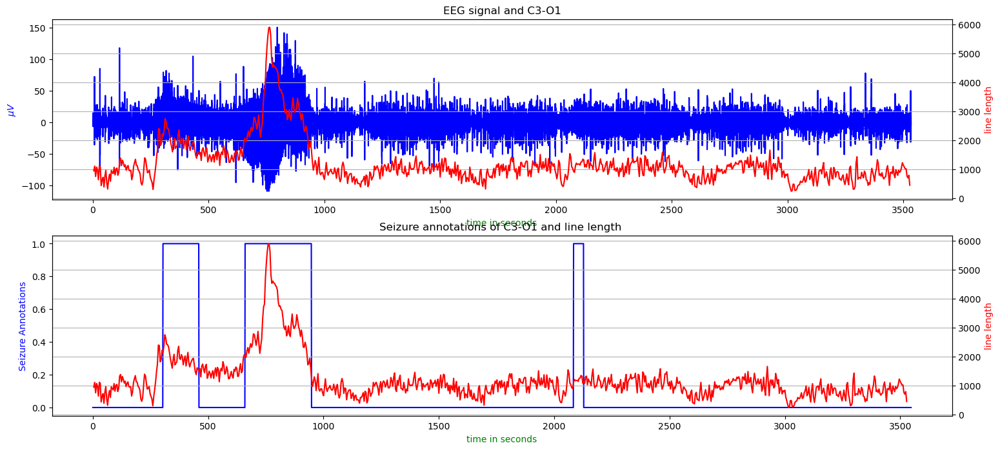

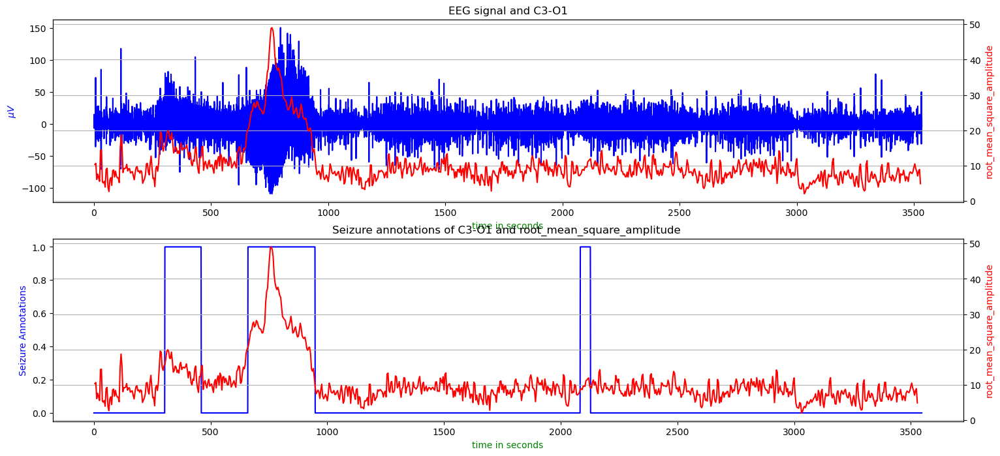

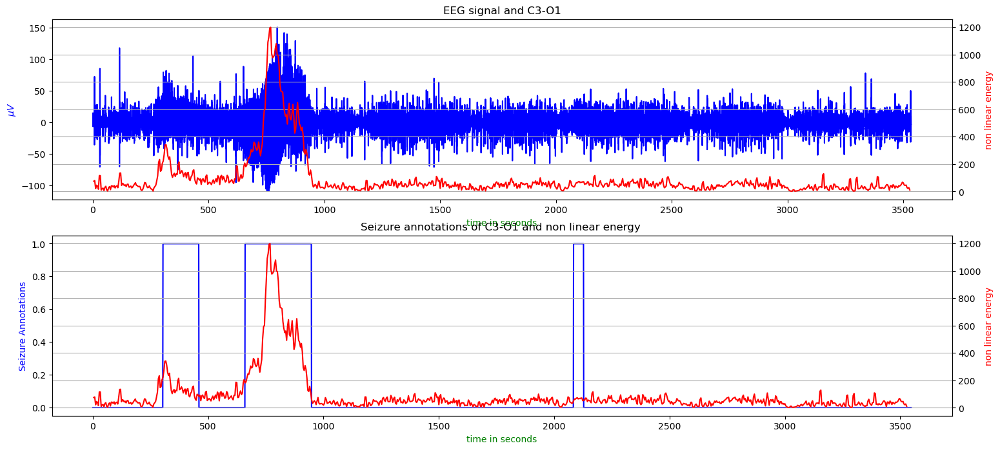

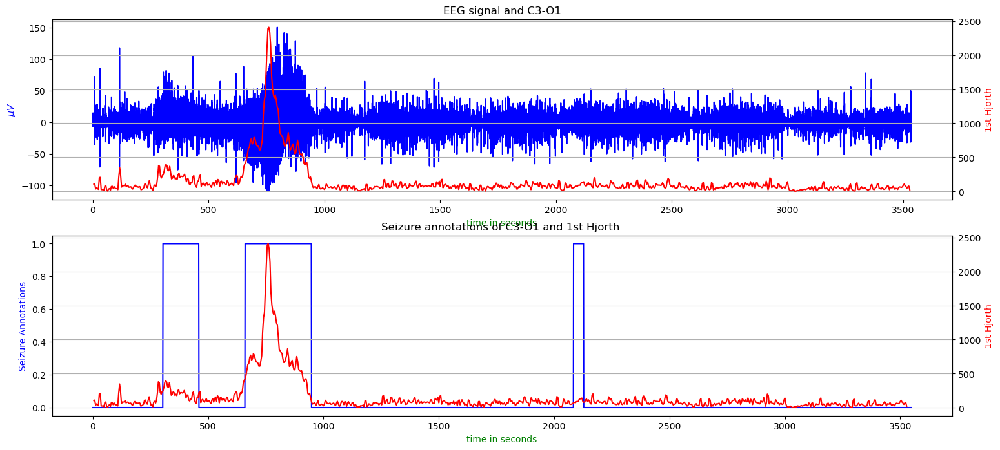

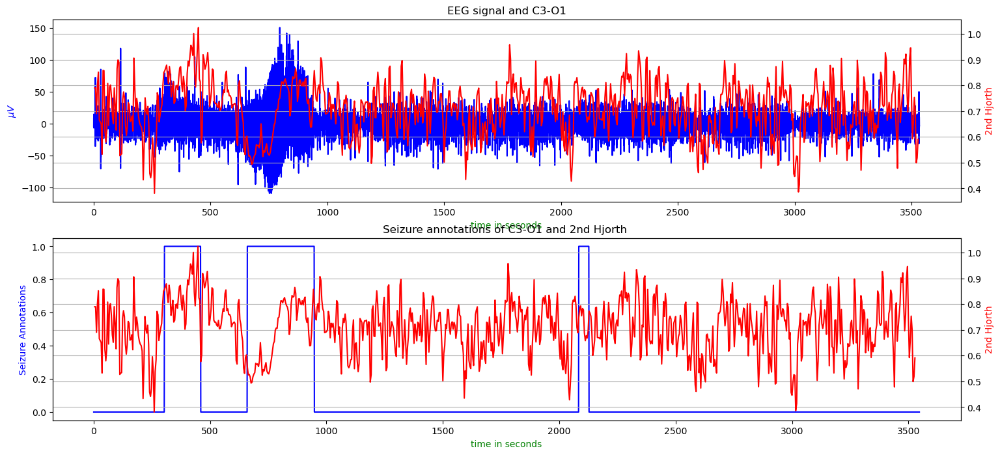

...

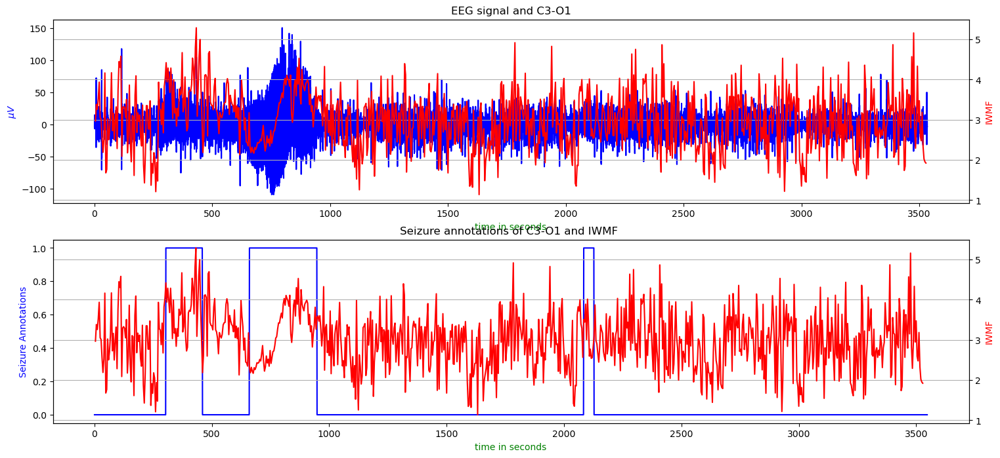

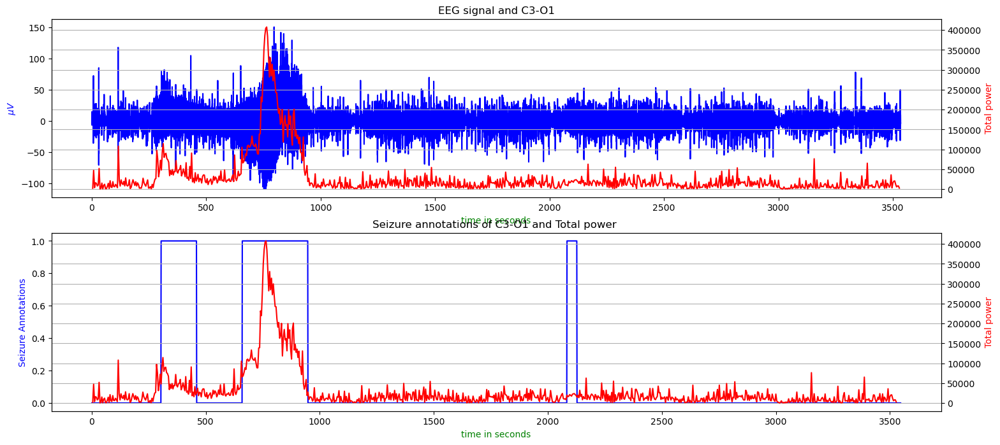

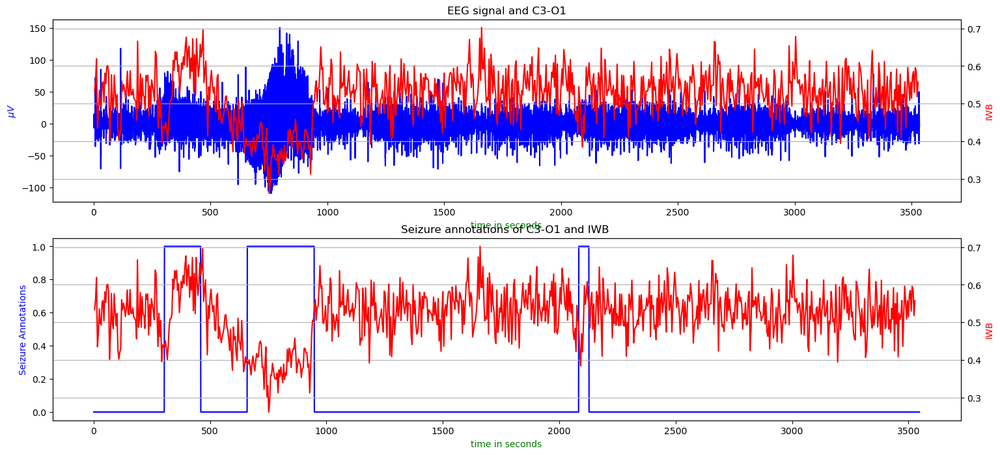

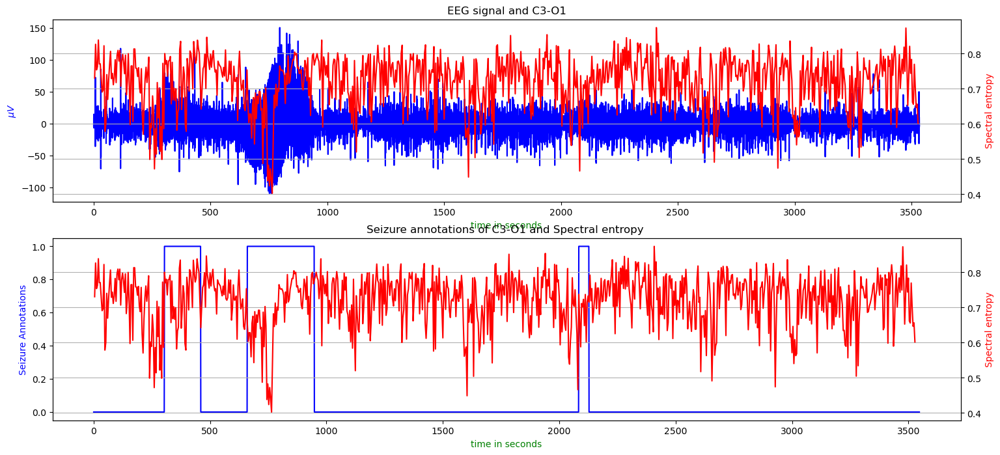

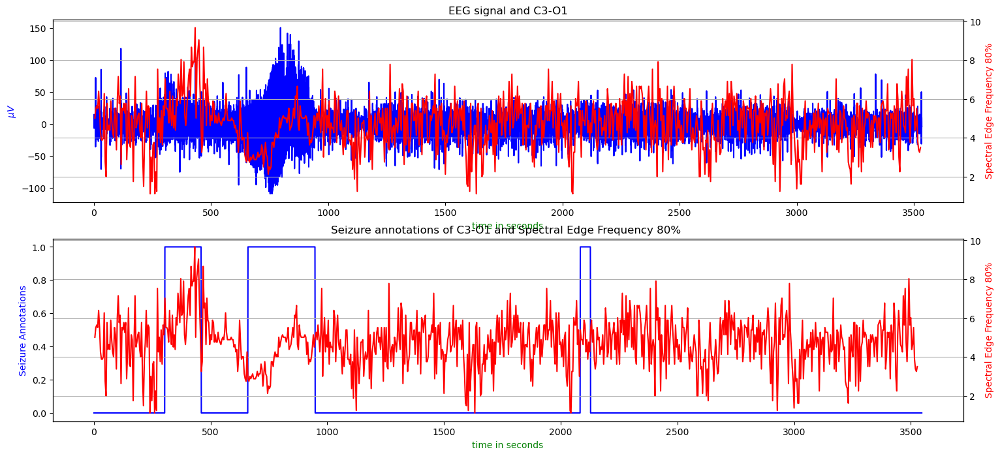

In [13]:
def plot_(start_column, end_column, channel = 'C3-O1'):
    channel_eeg, epoch_channel_annotations = \
        patient.eeg['C3-O1'].to_numpy(), \
            patient.annotations['C3-O1'].to_numpy()
    number_of_epochs = patient.n_epochs
    recordingtime= np.arange(0,len(channel_eeg),1)/32 
    featuretime= np.arange(1,number_of_epochs+1,1)*4
    df_xo = pd.DataFrame(
        patient.epochs_eeg['C3-O1'].to_numpy(), columns=all_features
        )
    for i, column in enumerate(df_xo.iloc[::, start_column:end_column]):
        fig, axs = plt.subplots(2, figsize=(18, 8))
        axs[0].set_title(f'EEG signal and {channel}')
        axs[0].set_xlabel('time in seconds', color='green')
        axs[0].set_ylabel('$\mu V$', color='blue')
        axs[0].plot(recordingtime, channel_eeg, color='blue')
        ax_0 = axs[0].twinx()
        ax_0.set_ylabel(str(column), color='red')
        ax_0.plot(featuretime, df_xo[column].to_numpy(), color='red')
        plt.grid()
        
        axs[1].set_title(f'Seizure annotations of {channel} and {column} ')
        axs[1].set_xlabel('time in seconds', color='green')
        axs[1].set_ylabel('Seizure Annotations', color='blue')
        axs[1].plot(epoch_channel_annotations, color='blue')
        ax_1 = axs[1].twinx()
        ax_1.set_ylabel(str(column), color='red')
        ax_1.plot(featuretime, df_xo[column].to_numpy(), color='red')
        plt.grid()
        plt.plot()

plot_(0, 20,)

### Next 19 features

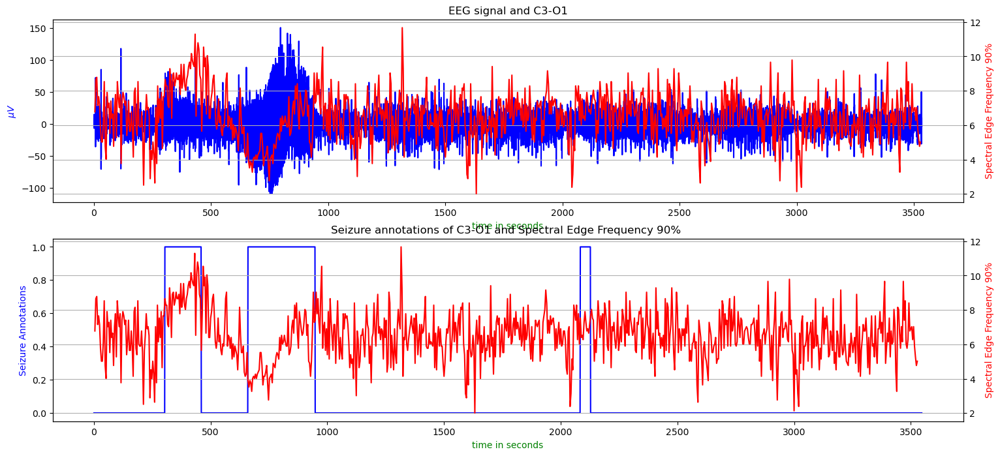

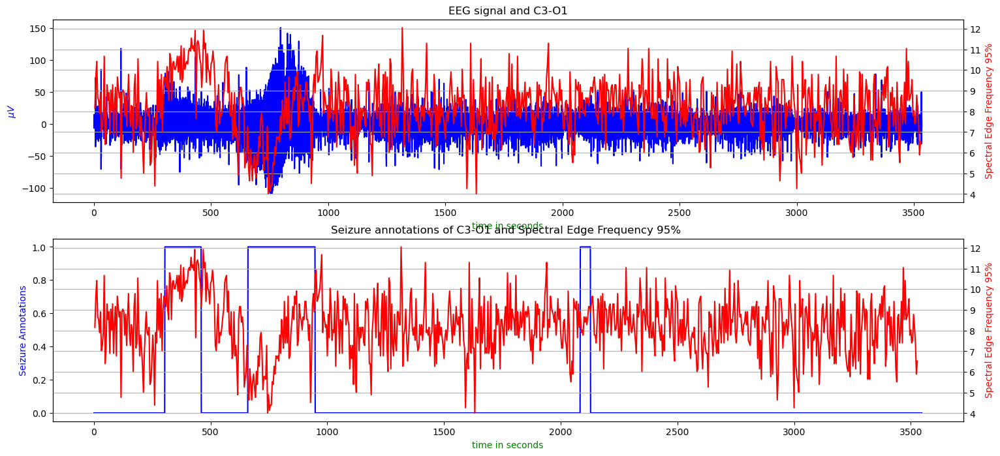

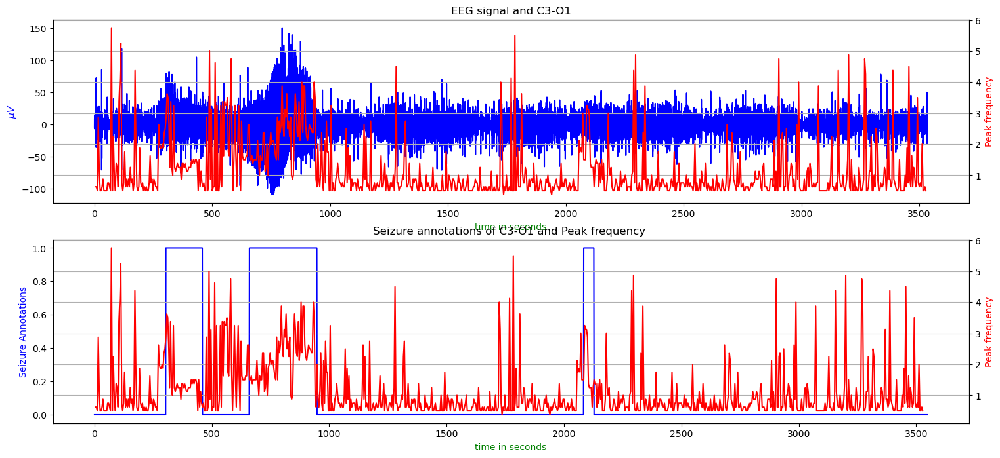

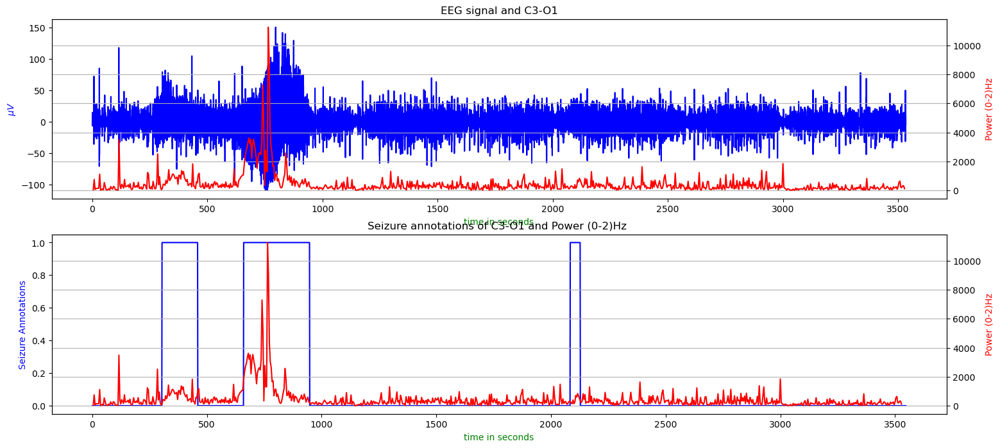

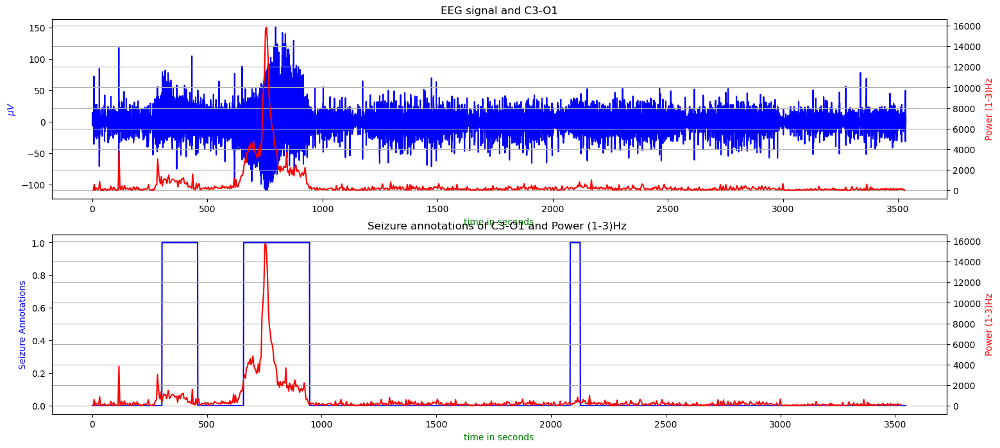

...

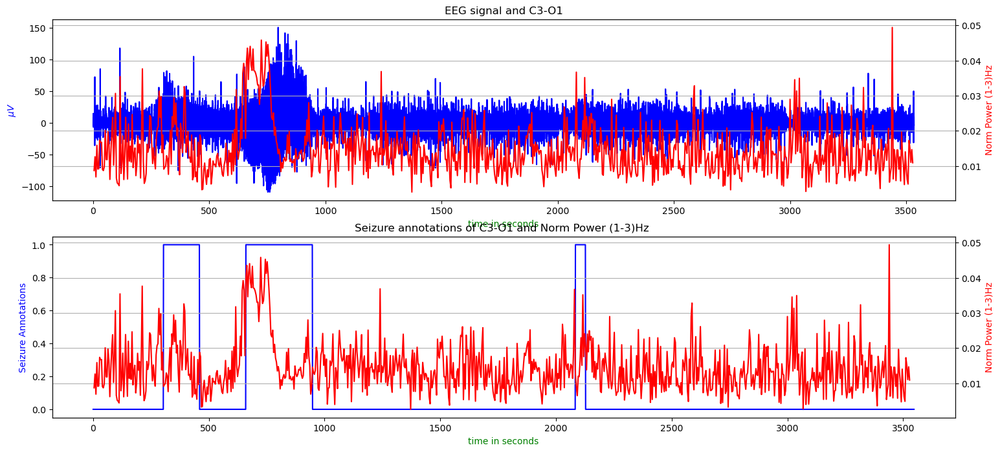

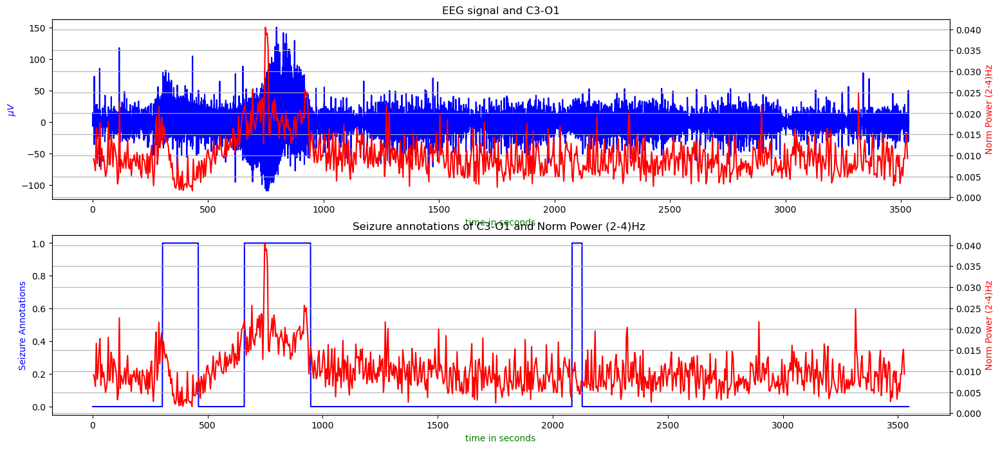

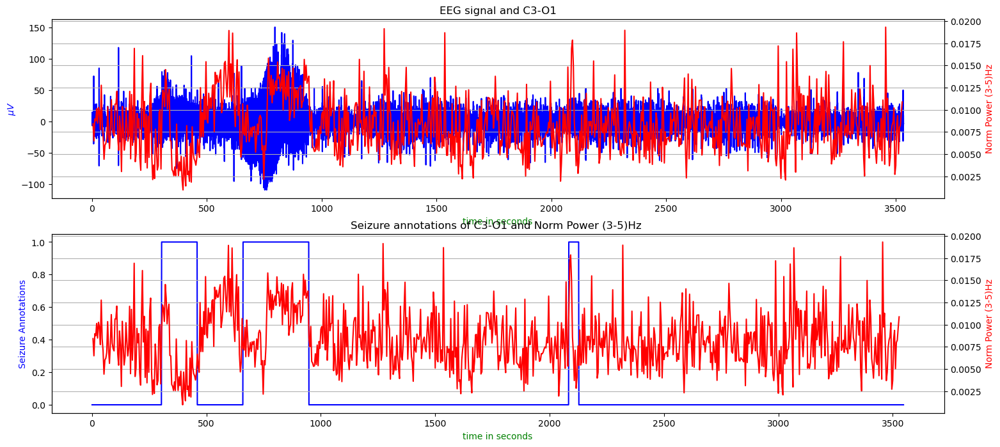

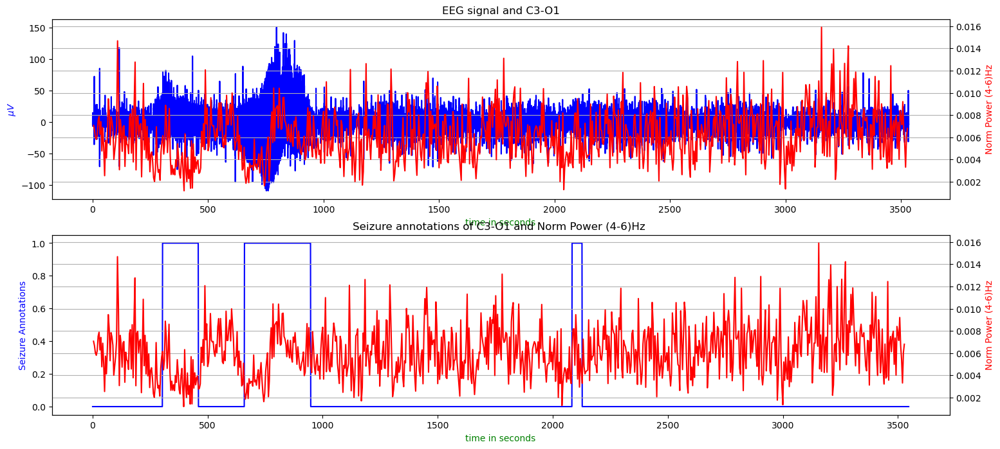

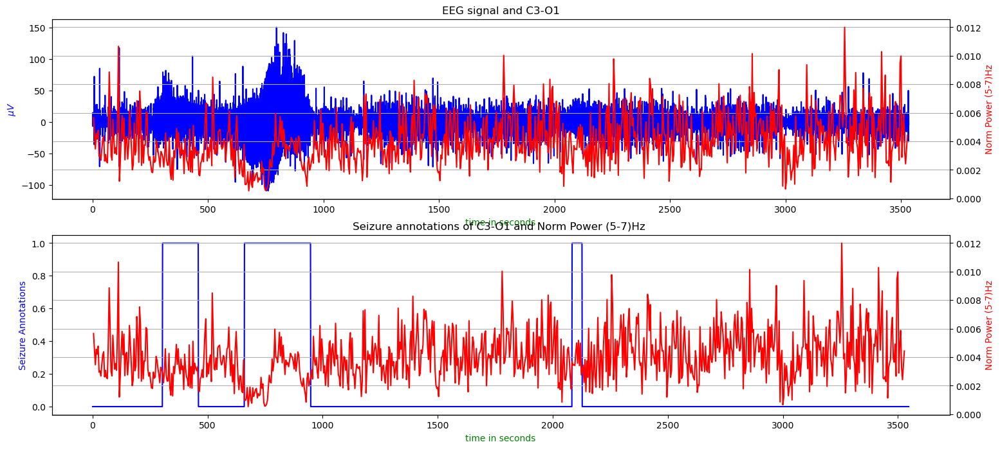

In [14]:
plot_(20, 40)

### last 6 features

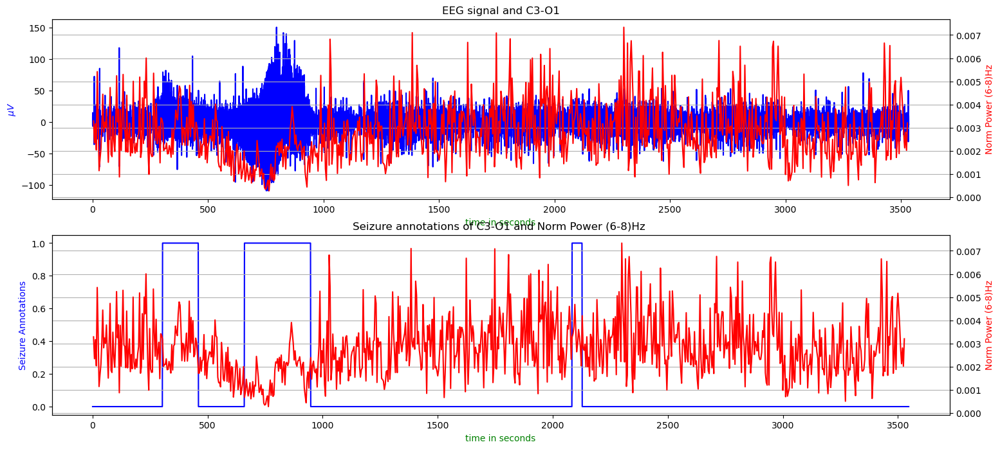

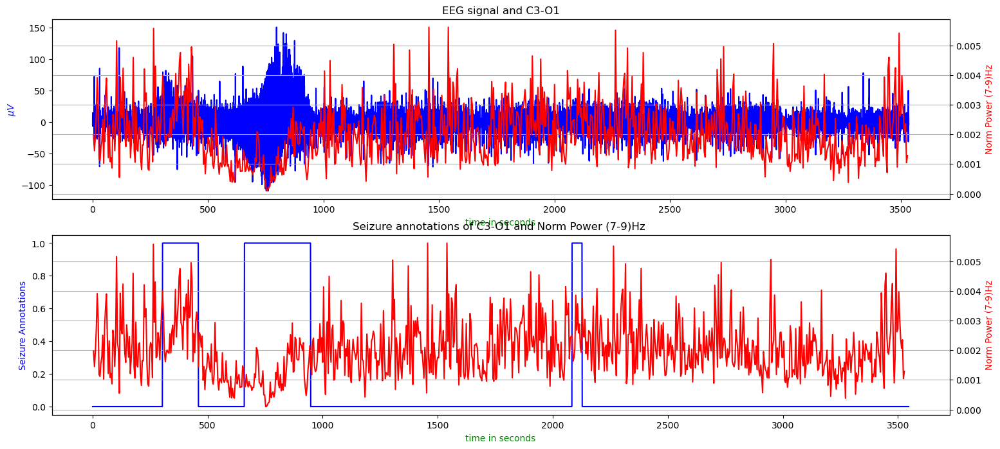

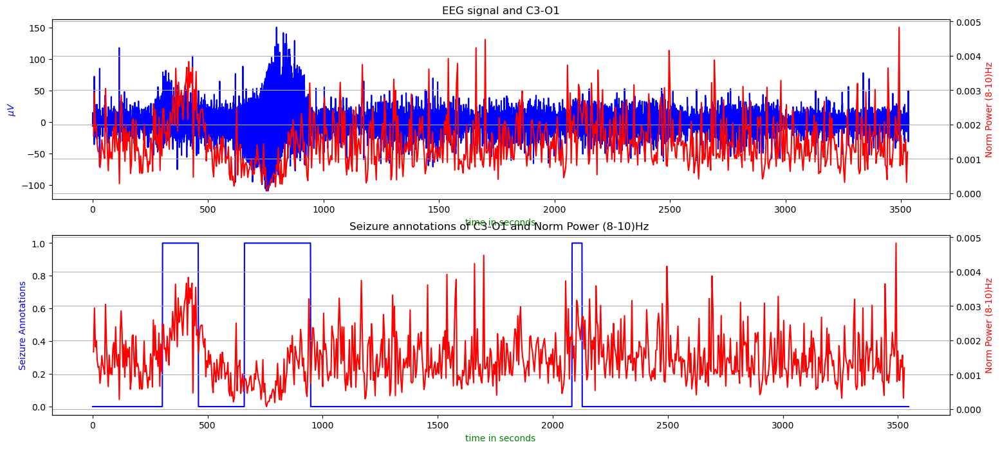

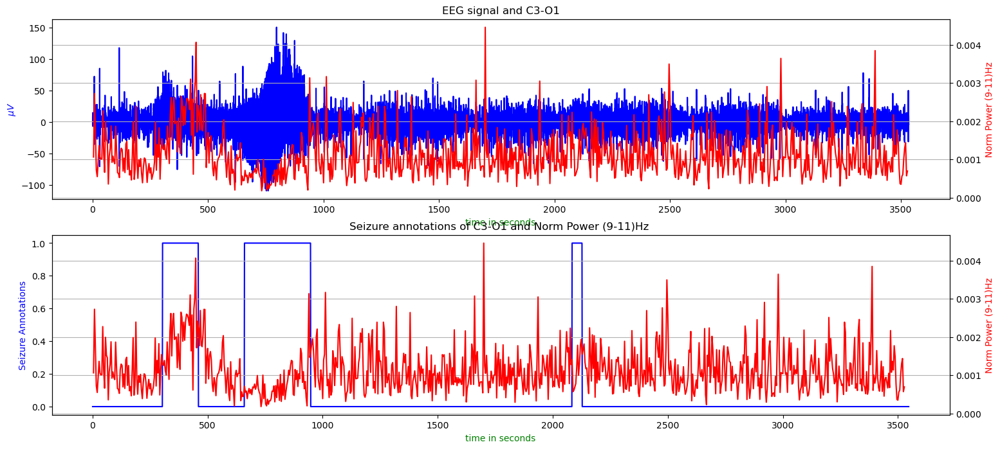

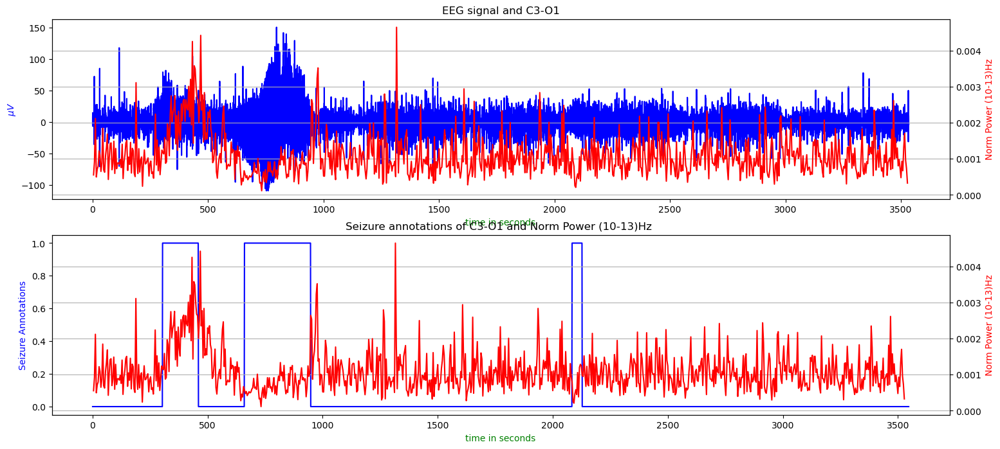

In [15]:
plot_(40, 46)

# DEVELOPING THE CLASSIFIER

Code to help extract train and test dataset

In [50]:
#The list `patients_list` to store all the patients for easy iteration
patients_list = [patient for patient in all_patients.values()]

print([patient.number for patient in patients_list])


def vector_label(patient):
    for i, (channel, epoch_data) in enumerate(patient.epochs_eeg.items()):
        n_epochs = patient.n_epochs
        annot = patient.annotations[channel].to_numpy()
        channel_annotations = np.array(
            [annot[i] for i in range(1, (n_epochs)*4, 4)]
            )
        if i == 0:
            first_df_x = pd.DataFrame(epoch_data.to_numpy(), columns=all_features)
            first_df_y = pd.DataFrame(channel_annotations, columns=['Annotations'])
            first_df = pd.concat([first_df_x, first_df_y], axis=1)
            continue
        df_x = pd.DataFrame(epoch_data.to_numpy(), columns=all_features)
        df_y = pd.DataFrame(channel_annotations, columns=['Annotations'])
        df = pd.concat([df_x, df_y], axis=1)
        first_df = pd.concat([first_df, df], axis=0)
    return first_df

def create_all_df(all_patients):
    for index, patient in enumerate(all_patients):
        if index == 0:
            main_df = vector_label(patient)
            continue
        main_df = pd.concat([main_df, vector_label(patient)], axis=0)
    return main_df


['13', '14', '19', '1', '21', '31', '34', '36', '38', '39', '44', '47', '4', '51', '5', '7', '9']


In [17]:
from itertools import combinations
train_pool = list(combinations(patients_list, 16))
print(train_pool)

[(<__main__.Patient object at 0x0000017195D90280>, <__main__.Patient object at 0x0000017195D90AC0>, <__main__.Patient object at 0x0000017195D90190>, <__main__.Patient object at 0x0000017195D65F30>, <__main__.Patient object at 0x0000017195D68910>, <__main__.Patient object at 0x0000017195D68880>, <__main__.Patient object at 0x000001719C056D70>, <__main__.Patient object at 0x000001719C069C00>, <__main__.Patient object at 0x000001719C080760>, <__main__.Patient object at 0x000001719C0835B0>, <__main__.Patient object at 0x000001719C096440>, <__main__.Patient object at 0x000001719C0AD600>, <__main__.Patient object at 0x000001719C0AFC70>, <__main__.Patient object at 0x000001719C0BF2E0>, <__main__.Patient object at 0x000001719C0D5E40>, <__main__.Patient object at 0x000001719C0E5000>), (<__main__.Patient object at 0x0000017195D90280>, <__main__.Patient object at 0x0000017195D90AC0>, <__main__.Patient object at 0x0000017195D90190>, <__main__.Patient object at 0x0000017195D65F30>, <__main__.Patien

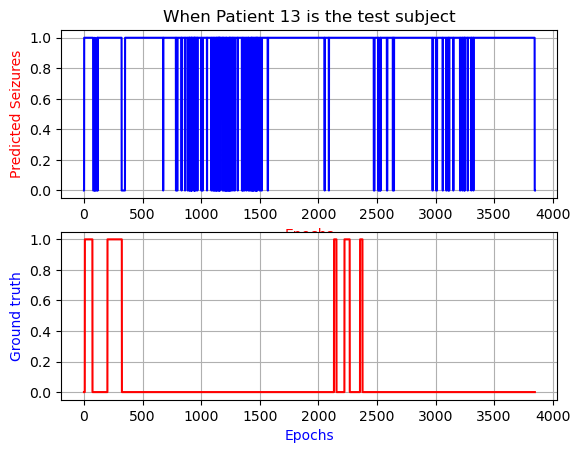

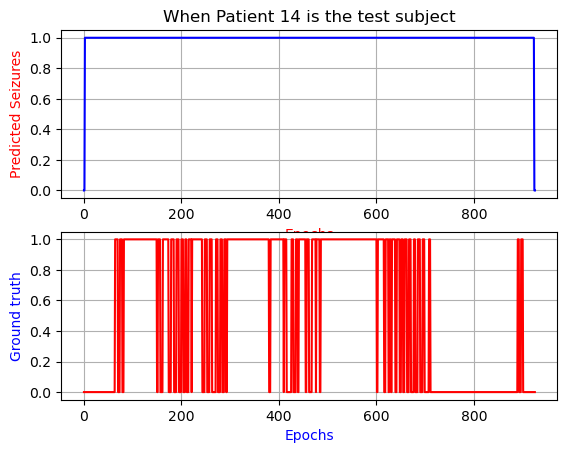

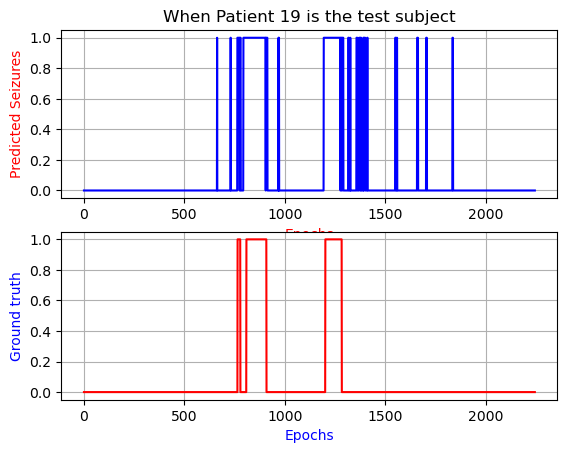

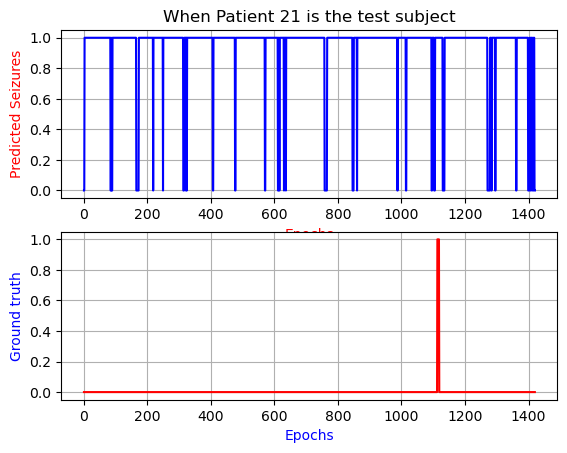

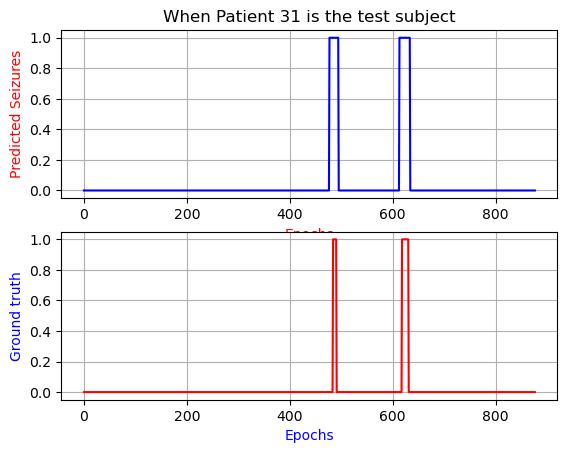

...

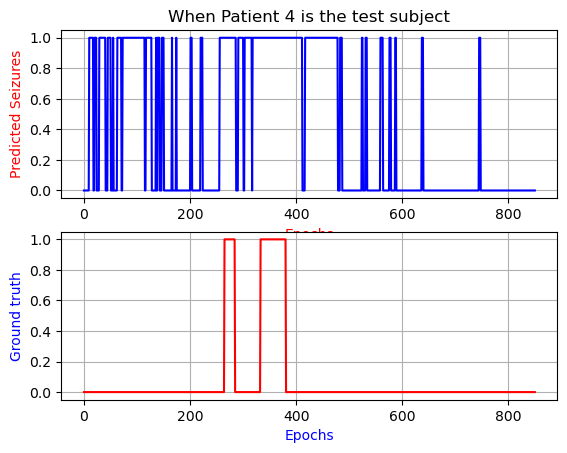

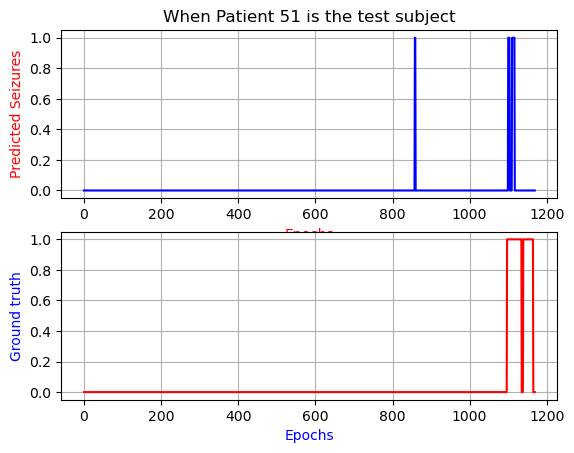

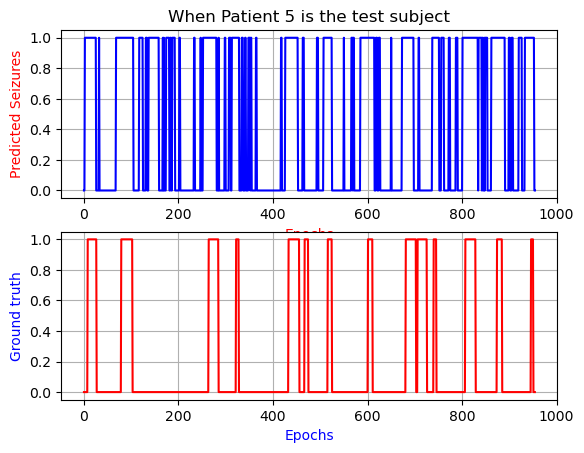

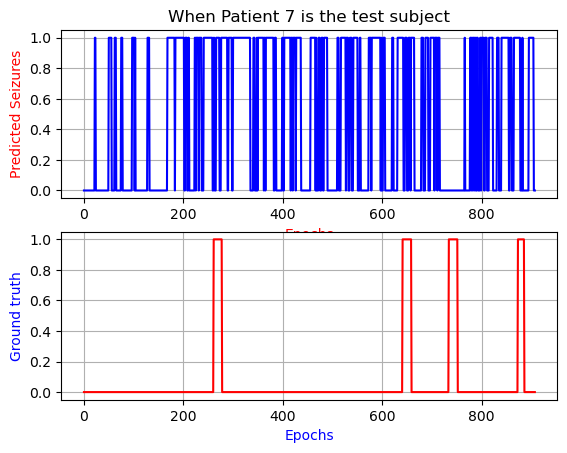

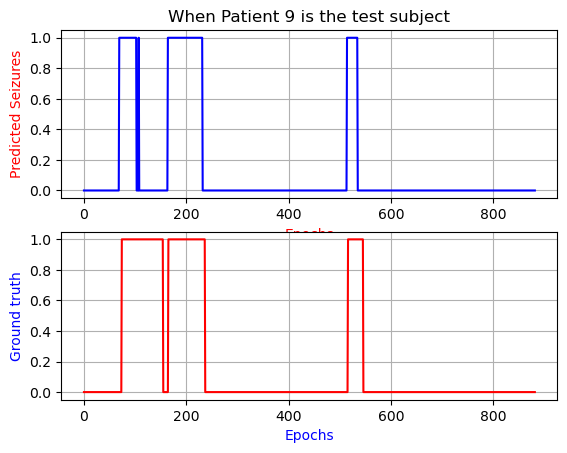

In [129]:
from sklearn.svm import SVC


test_channels_annotations = {}
predicted_channels_annotations = {}
test_channels_epochs = {}
all_channels = [
        'F4-C4', 'C4-O2', 'F3-C3', 'C3-O1',
        'T4-C4', 'C4-Cz', 'Cz-C3', 'C3-T3'
        ]


def sort_test_patient(patient, test_df):
    n = patient.n_epochs
    for i, channel in enumerate(all_channels):
        test_channels_annotations[channel] = test_df.iloc[i*n:(i+1)*n, -1].dropna()
        test_channels_epochs[channel] = test_df.iloc[i*n:(i+1)*n, 0:-1].dropna()


def handle_class_imbalance(train_df):
    normal_class = train_df[train_df['Annotations'] == 0]
    seizure_class = train_df[train_df['Annotations'] == 1]
    desired_nc_size = np.ceil(1.25 * len(seizure_class)) / len(normal_class)
    normal_class = normal_class.sample(frac=desired_nc_size)
    train_df = pd.concat((normal_class, seizure_class), axis=0).sample(frac=1)
    return train_df


def moving_average(arr, window_size):
    i = 0
# Initialize an empty list to store moving averages
    moving_averages = []
    while i < len(arr) - window_size + 1:
    
        # Calculate the average of current window
        window_average = round(np.sum(arr[
        i:i+window_size]) / window_size, 2)
        
        # Store the average of current
        # window in moving average list
        moving_averages.append(window_average)
        
        # Shift window to right by one position
        i += 1
    
    return moving_averages


def central_moving_average(arr, window_size):
    ma_arr = moving_average(arr, window_size)
    new_arr = np.array([])
    for i in range(len(ma_arr)-1):
        new_arr = np.append(new_arr, ((ma_arr[i] + ma_arr[i+1])/2))
    for i in range(window_size - (window_size // 2)):
        new_arr = np.insert(new_arr, 0, 0)
    for i in range(window_size - (window_size//2)):
        new_arr = np.append(new_arr, 0)
    return np.array([i for i in range(len(arr))]), new_arr


def thresholding(arr, threshold):
    new_arr = np.array([])
    for i in range(len(arr)):
        if arr[i] >= threshold:
            new_arr = np.append(new_arr, 1)
        else:
            new_arr = np.append(new_arr, 0)
    return new_arr


def train_postprocess(train_data, test_data):
    predicted = svm_clf.predict_proba(test_data.to_numpy())
    points, pred = central_moving_average(predicted[::, 1], 4)
    # plt.plot(points, pred)
    # plt.plot(points, pred)
    # plt.show()
    pred_annots = thresholding(pred, 0.4)
    # plt.plot(pred_annots)
    # plt.show()
    return pred_annots



def ground_truth():
    for i, channel in enumerate(all_channels):
        if i == 0:
            gt = np.array([test_channels_annotations[channel]]).T
            continue
        new = np.array([test_channels_annotations[channel]]).T
        gt = np.concatenate((gt, new), axis=1)
    ans = np.amax(gt, axis=1)
    return ans


def pred_truth():
    for i, channel in enumerate(all_channels):
        if i == 0:
            gt = np.array([predicted_channels_annotations[channel]]).T
            continue
        new = np.array([predicted_channels_annotations[channel]]).T
        gt = np.concatenate((gt, new), axis=1)
    ans = np.amax(gt, axis=1)
    return ans

def predict_and_tune():
    gdr = 0
    fdr = 0

    
for patient in patients_list:
    for train_batch in train_pool:
        if patient.number == '1':
            continue
        if patient not in train_batch:
            test_patient = patient
            train_df = create_all_df(train_batch).dropna()
            train_df = handle_class_imbalance(train_df)
            testing_df = create_all_df([patient,]).dropna()
            sort_test_patient(test_patient, testing_df)
            svm_clf = SVC(probability=True)
            svm_clf.fit(
                train_df.iloc[::, 0:-1].to_numpy(), 
                train_df.iloc[::, -1].to_numpy()
                )
            for channel in all_channels:
                predictions = train_postprocess(
                    train_df, test_channels_epochs[channel]
                    )
                predicted_channels_annotations[channel] = predictions
            predicted_truth = pred_truth()
            gt = ground_truth()
            fig, ax = plt.subplots(2)
            ax[0].set_title(
                f'When Patient {patient.number} is the test subject'
                )
            ax[0].set_xlabel('Epochs', color='red')
            ax[0].set_ylabel('Predicted Seizures', color='red')
            ax[0].plot(predicted_truth, color ='blue')
            ax[0].grid()

            ax[1].set_xlabel('Epochs', color='blue')
            ax[1].set_ylabel('Ground truth', color='blue')
            ax[1].plot(gt, color='red')
            ax[1].grid()
            plt.show()
        test_channels_annotations = {}
        predicted_channels_annotations = {}
        test_channels_epochs = {}
    else:
        continue

A threshold of 0.4 was used, a recommendation would be to do some additional cross validation to know optimal parameters like threshold and window length of the centered moving average filter,

every patient was used as a test case in a leave one out cross validation approach, but all plots are not shown due to time constraints

### WHY WAS CLASS IMBALANCE HANDLED?

class Imbalance has adverse negative effects in the performance of classifiers, support vector machines are designed to adequately maximize the distance between the nearest data points and the decision boundary, so if there are redundant class instances near the decision boundary or so little it can hamoper the performance of the classifier. Class imbalance causes high bias and poor variance/generalization of svm classifiers in the field. This can affect ROC and AUC scores, due to poor recall. To handle imbalance, uniform down sampling of the Majority class which is non seizure was perfomed on every training dataset, the example of the implementation of the `handle_class_imbalance` function is provided. 

The function `handle_class_imbalance` defined earlier was used to cater to class imbalance an example is provided here of its operation


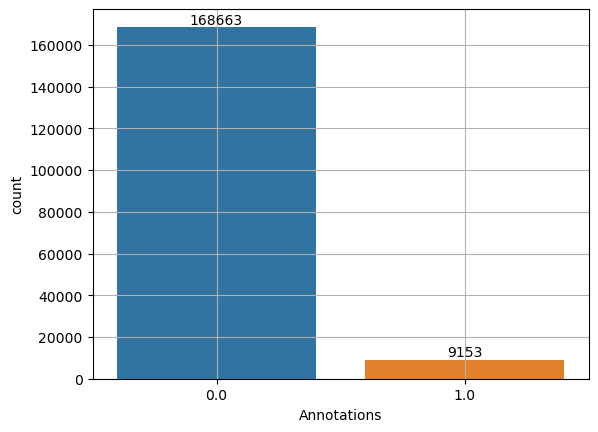

In [131]:
import seaborn as sns
train_df = create_all_df(train_pool[0])
ax = sns.countplot(x='Annotations', data=train_df,)
abs_vals = train_df['Annotations'].value_counts(ascending=False).values
ax.bar_label(container=ax.containers[0], labels=abs_vals)
plt.grid()
plt.show()

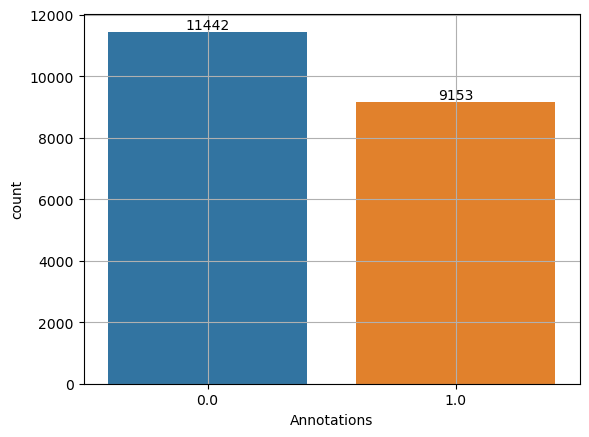

In [132]:
train_df = handle_class_imbalance(train_df)
ax = sns.countplot(x='Annotations', data=train_df,)
abs_vals = train_df['Annotations'].value_counts(ascending=False).values
ax.bar_label(container=ax.containers[0], labels=abs_vals)
plt.grid()
plt.show()

In [ ]:
def group_seizure(arr):
    new_arr = []
    pos, mark = 0, 0
    while mark < len(arr):
        if arr[mark] == 1:
            sub_arr = []
            while arr[pos] == 1:
                sub_arr.append(pos)
                pos += 1
                mark += 1
            new_arr.append(sub_arr)
        mark += 1
        pos += 1
    return new_arr


a = group_seizure(actual)
b = group_seizure(pred_annots)
print(a)
print(b)